RESUMEN DEL PROCESO

# Se cambio el nombre de Columnas a Mayúsculas.

# Se eliminan columnas que no son relevantes para la informacion que se necesita.
     #FLIGHT_NO, UNNAMED:0, ROUTE y GROUND.

# Se convierte la Columna "FECHA" a datetime

# Se Convierte la columna "HORA DECLARADA" a formato de hora (HHMM).

     #Contar los valores NaT en la columna "HORA DECLARADA".

     #Eliminar las filas con valores NaT en la columna "HORA DECLARADA".


# Reemplazar el signo de pregunta '?' con NaN en la columna "OPERADOR".

     #Eliminar filas con NaN en la columna "OPERADOR".

# Renombrar algunas columnas para mayor claridad.


# Eliminar filas que contienen este signo '?' en la columna "TIPO_AERONAVE".


# Eliminar columnas 'IDENTIFICACION_AERONAVE' y 'NUMERO_SERIE_AERONAVE'.


# Eliminar este signo '?' de las columnas "PASAJEROS_FALLECIDOS" y "TRIPULACION_FALLECIDA".


# Eliminar filas que contienen este signo '?' en la columna "DESCRIPCION_ACCIDENTE".


# Eliminar filas que contienen '?' en cualquier columna.


# Convertir DataFrame a una cadena de texto manteniendo los formatos originales.


# # Convertir las columnas relevantes a numéricas


# Mostrar la tabla con todas las columnas consecutivas




In [114]:
import pandas as pd
import numpy as np

# ETL

# Ruta al archivo CSV
ruta_archivo_csv = 'AccidentesAviones.csv'  

# Leer el archivo CSV y crear un DataFrame
df = pd.read_csv("AccidentesAviones.csv")

# Cambiar los nombres de las columnas a mayúsculas
df.columns = df.columns.str.upper()

# Eliminar las columnas FLIGHT_NO y UNNAMED:0
df.drop(['FLIGHT_NO', 'UNNAMED: 0'], axis=1, inplace=True)

# Eliminar la columna 'ROUTE'
df.drop('ROUTE', axis=1, inplace=True)

# Eliminar la columna 'GROUND'
df.drop('GROUND', axis=1, inplace=True)

# Convertir la columna "FECHA" a tipo datetime, ignorando los errores
df['FECHA'] = pd.to_datetime(df['FECHA'], errors='coerce')

# Convertir la columna "HORA DECLARADA" a formato de hora (HHMM)
df['HORA DECLARADA'] = pd.to_datetime(df['HORA DECLARADA'], format='%H%M', errors='coerce').dt.time

# Contar los valores NaT en la columna "HORA DECLARADA"
cantidad_nat = df['HORA DECLARADA'].isna().sum()

# Eliminar las filas con valores NaT en la columna "HORA DECLARADA"
df.dropna(subset=['HORA DECLARADA'], inplace=True)
df.reset_index(drop=True, inplace=True)

# Reemplazar '?' con NaN en la columna "OPERADOR"
df['OPERADOR'].replace('?', np.nan, inplace=True)

# Eliminar filas con NaN en la columna "OPERADOR"
df.dropna(subset=['OPERADOR'], inplace=True)

df = df.rename(columns={
    'AC_TYPE': 'TIPO_AERONAVE',
    'REGISTRATION': 'IDENTIFICACION_AERONAVE',
    'CN_LN': 'NUMERO_SERIE_AERONAVE',
    'ALL_ABOARD': 'PERSONAS_ABORDO',
    'CREW_ABOARD': 'TRIPULACION_ABORDO',
    'PASSENGER_FATALITIES': 'PASAJEROS_FALLECIDOS',
    'CREW_FATALITIES': 'TRIPULACION_FALLECIDA',
    'SUMMARY': 'DESCRIPCION_ACCIDENTE'
})

# Eliminar filas con '?' en la columna "TIPO_AERONAVE"
df = df[df['TIPO_AERONAVE'] != '?']

# Lista de columnas a eliminar
columnas_a_eliminar = ['IDENTIFICACION_AERONAVE', 'NUMERO_SERIE_AERONAVE']

# Eliminar las columnas 'IDENTIFICACION_AERONAVE' y 'NUMERO_SERIE_AERONAVE'
df.drop(columnas_a_eliminar, axis=1, inplace=True)

# Eliminar las filas que contienen '?'
df = df[~df['PERSONAS_ABORDO'].astype(str).str.contains('\?')]

# Eliminar las filas que contienen '?' en la columna "PASAJEROS A BORDO"
df = df[~df['PASAJEROS A BORDO'].astype(str).str.contains('\?')]

# Eliminar '?' de las columnas "PASAJEROS_FALLECIDOS" y "TRIPULACION_FALLECIDA"
df['PASAJEROS_FALLECIDOS'] = df['PASAJEROS_FALLECIDOS'].str.replace('?', '')
df['TRIPULACION_FALLECIDA'] = df['TRIPULACION_FALLECIDA'].str.replace('?', '')

# Eliminar las filas que contienen signos de interrogación en DESCRIPCION_ACCIDENTE
df = df[~df['DESCRIPCION_ACCIDENTE'].str.contains('\?')]

# Eliminar las filas que contienen signos de interrogación en cualquier columna
df = df[~df.astype(str).apply(lambda x: x.str.contains('\?')).any(axis=1)]

# Convertir DataFrame a una cadena de texto manteniendo los formatos originales
tabla_texto = df.to_string(index=True)

# Convertir las columnas relevantes a numéricas
columnas_numericas = ['PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO', 'CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA']

# Intentar convertir a numérico
for col in columnas_numericas:
    try:
        df[col] = pd.to_numeric(df[col])
    except ValueError as e:
        print(f"No se pudo convertir la columna {col} a numérico. Motivo: {str(e)}")

# Mostrar la tabla con todas las columnas.
print(tabla_texto)

print(df)




          FECHA HORA DECLARADA                                                                  RUTA                                                           OPERADOR                               TIPO_AERONAVE PERSONAS_ABORDO PASAJEROS A BORDO TRIPULACION_ABORDO CANTIDAD DE FALLECIDOS PASAJEROS_FALLECIDOS TRIPULACION_FALLECIDA                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

# Se revisa para asegurarnos que no hay valores faltantes en ninguna columna que nos genere inconsistencias en la medicion de los datos.

In [137]:
# Eliminar filas con valores faltantes
df_sin_nulos = df.dropna()
# Verificar que no hay valores faltantes
print("Valores faltantes por columna en el nuevo DataFrame:\n", df_sin_nulos.isnull().sum())



Valores faltantes por columna en el nuevo DataFrame:
 FECHA                     0
HORA DECLARADA            0
RUTA                      0
OPERADOR                  0
TIPO_AERONAVE             0
PERSONAS_ABORDO           0
PASAJEROS A BORDO         0
TRIPULACION_ABORDO        0
CANTIDAD DE FALLECIDOS    0
PASAJEROS_FALLECIDOS      0
TRIPULACION_FALLECIDA     0
DESCRIPCION_ACCIDENTE     0
DÉCADA                    0
AÑO                       0
dtype: int64


# Se hace una visualizacion de las columnas para verificar que con los graficos se soporte la informacion y los datos del Data frame logicamente.

# Ejemplo: Tenemos Personas a Bordo y el numero debe ser > que Pasajeros a Bordo y Tripulacion a Bordo debe ser < que el dato anterior, pasa exactamente igual con la Cantidad de Fallecidos que debe ser > a Pasajeros Fallecidos y Tripulacion Fallecida debe ser < al dato anterior, se puede corroborar en el grafico de variables relevantes.

# En cuanto a los valores atipicos, se evidencia la cantidad por columna, estos son representativos  y tienen una razón válida y de  importancia para el análisis, por esto se toma la decision de no transformarlos, aca podriamos modificar estos valores entrenando un modelo de ML teniendo en cuenta la mediana de cada columna y reducirian los valores atipicos, pero para el contexto no es lo mas adecuado. 

# En el grafico se hace una visualizacion de las columnas PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO','CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA para ubicarnos graficamente dentro del contexto de los datos.

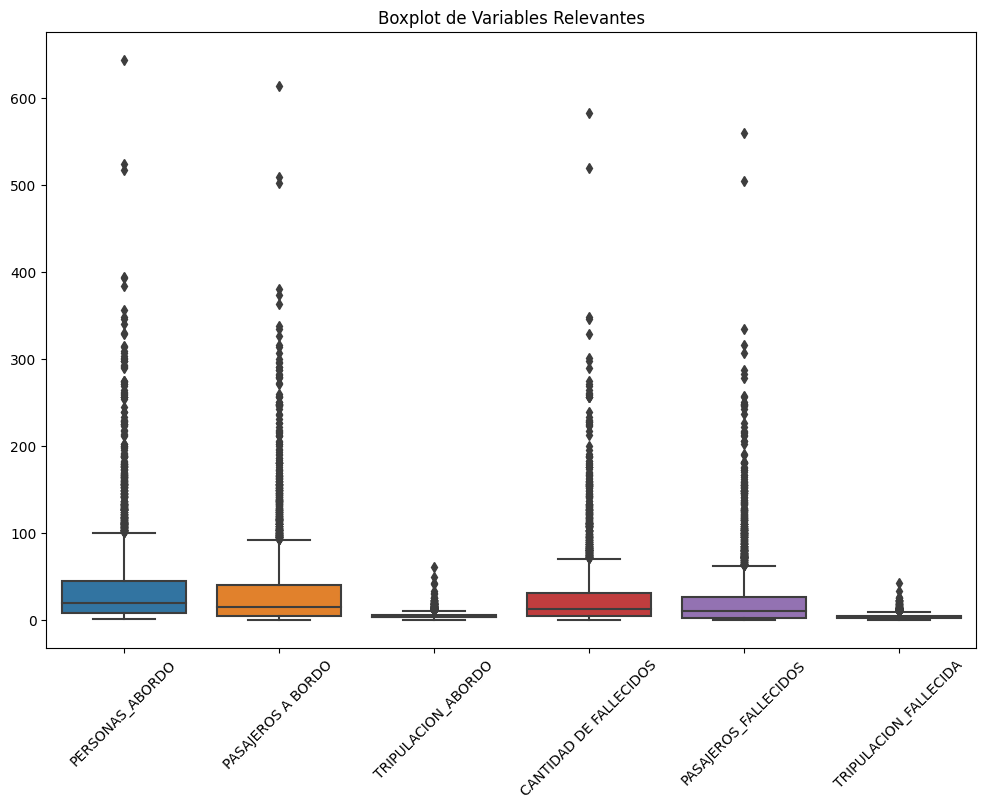

Valores atípicos por columna:
 PERSONAS_ABORDO           317
PASAJEROS A BORDO         318
TRIPULACION_ABORDO        219
CANTIDAD DE FALLECIDOS    322
PASAJEROS_FALLECIDOS      334
TRIPULACION_FALLECIDA     191
dtype: int64


In [117]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualizar distribución de las columnas con boxplots
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[['PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO',
                     'CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA']])
plt.title('Boxplot de Variables Relevantes')
plt.xticks(rotation=45)  # Rotar etiquetas en el eje x para mayor claridad
plt.show()

# Calcular valores atípicos usando el rango intercuartílico (IQR)
Q1 = df[['PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO',
         'CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA']].quantile(0.25)
Q3 = df[['PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO',
         'CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA']].quantile(0.75)
IQR = Q3 - Q1

# Contar los valores atípicos por columna
outliers_count = ((df[['PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO',
                      'CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA']] < (Q1 - 1.5 * IQR)) |
                  (df[['PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO',
                      'CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA']] > (Q3 + 1.5 * IQR))).sum()

print("Valores atípicos por columna:\n", outliers_count)



# Se revisa si existen datos duplicados que pueden interferir con el analisis de los datos.

In [138]:
# Contar registros duplicados
registros_duplicados = df.duplicated().sum()
print("Registros duplicados:", registros_duplicados)

Registros duplicados: 0


# Conclusión y análisis:

# A partir del gráfico de barras, se puede observar la distribución del número de accidentes a lo largo de las décadas.

# Se Pueden identificar picos en ciertas décadas, lo que indica períodos de mayor actividad o posiblemente mayores desafíos en términos de seguridad en la aviación.

# También se  pueden observar tendencias a lo largo del tiempo, como una disminución o aumento en la cantidad de accidentes, lo que puede indicar mejoras en la seguridad de la aviación o períodos de mayor riesgo, respectivamente.

# Este análisis proporciona una visión general de cómo ha evolucionado la seguridad en la aviación a lo largo de las décadas y puede ayudar a identificar áreas de enfoque para mejorar este aspecto en el futuro.

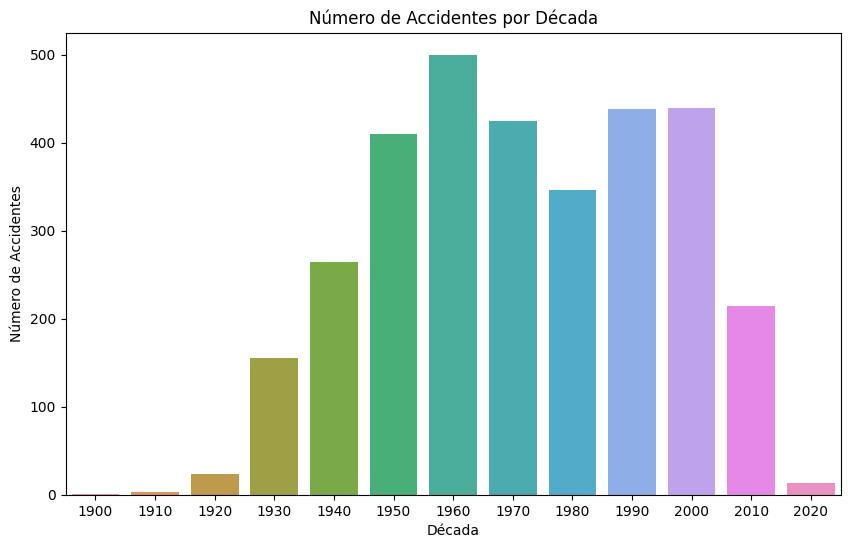

In [139]:
# Agrupar por década y contar el número de accidentes
df['DÉCADA'] = df['FECHA'].dt.year // 10 * 10
accidentes_por_decada = df.groupby('DÉCADA').size()

# Graficar el número de accidentes por década
plt.figure(figsize=(10, 6))
sns.barplot(x=accidentes_por_decada.index, y=accidentes_por_decada.values)
plt.xlabel('Década')
plt.ylabel('Número de Accidentes')
plt.title('Número de Accidentes por Década')
plt.show()

# Conclusión y análisis:

# El gráfico de barras proporciona una visión rápida de las rutas con la mayor cantidad de accidentes. La longitud de las barras indica el número de accidentes para cada ruta en el conjunto de datos.

# Al observar este gráfico, se pueden identificar las rutas con la mayor cantidad de accidentes, lo que podría indicar áreas geográficas o trayectos particulares que pueden requerir una atención especial en términos de seguridad y regulación.

# Este análisis permite a las autoridades de aviación y a la industria identificar posibles rutas críticas en términos de seguridad, lo que puede ayudar a dirigir esfuerzos para mejorar la seguridad en esas rutas específicas y reducir la incidencia de accidentes en el futuro.

# Además, se utiliza un mapeo de colores ("plasma") para resaltar visualmente las diferencias en el número de accidentes entre las rutas, lo que facilita la identificación de las rutas con un mayor número de accidentes.



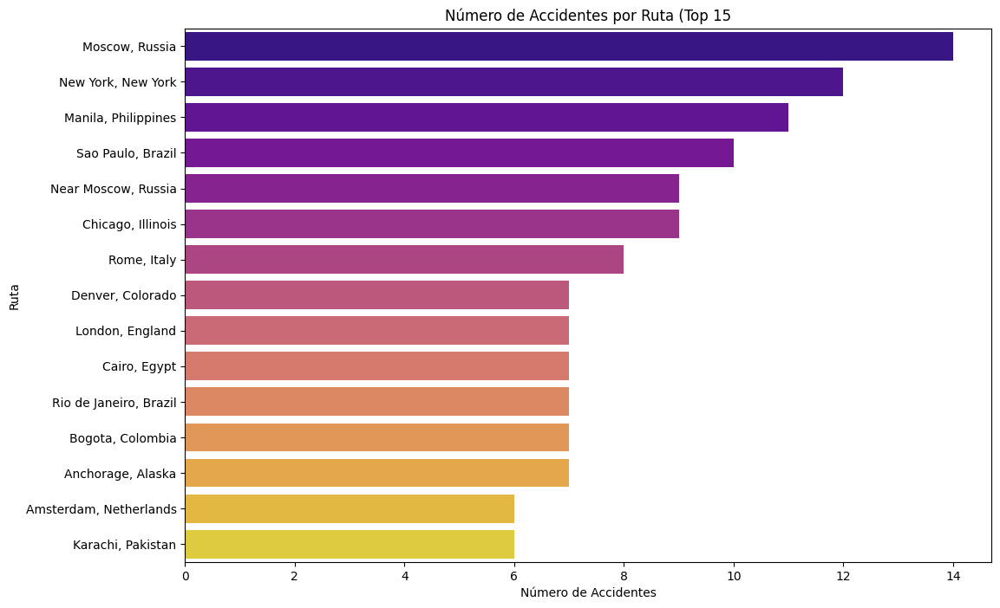

In [141]:
# Agrupar por ruta y contar el número de accidentes
accidentes_por_ruta = df['RUTA'].value_counts().nlargest(15)

# Graficar el número de accidentes por ruta
plt.figure(figsize=(12, 8))
sns.barplot(x=accidentes_por_ruta.values, y=accidentes_por_ruta.index, palette='plasma')
plt.xlabel('Número de Accidentes')
plt.ylabel('Ruta')
plt.title('Número de Accidentes por Ruta (Top 15')
plt.show()

# El gráfico de barras proporciona una visión rápida de los tipos de aeronaves que han experimentado el mayor número de accidentes. La longitud de las barras indica el número de accidentes para cada tipo de aeronave en el conjunto de datos.

# Al observar este gráfico, se pueden identificar los tipos de aeronaves más propensos a sufrir accidentes, lo que puede ser crucial para la mejora de la seguridad en la aviación. Las autoridades y la industria podrían concentrar esfuerzos en mejorar la seguridad de estos tipos de aeronaves específicos.

# El uso de un mapeo de colores ("viridis") ayuda a resaltar visualmente las diferencias en el número de accidentes entre los diferentes tipos de aeronaves, lo que facilita la identificación de los tipos más problemáticos en términos de accidentes.

# Este análisis es esencial para tomar decisiones informadas sobre cómo mejorar la seguridad de la aviación y puede influir en la regulación, la formación de pilotos y otros aspectos de la industria aeronáutica.


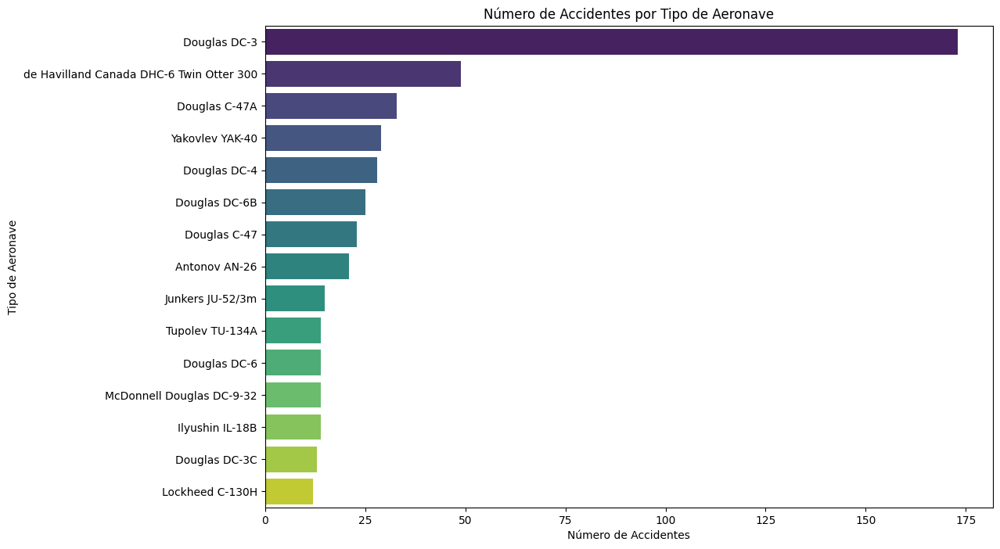

In [142]:
import seaborn as sns

# Contar el número de accidentes por tipo de aeronave
accidentes_por_tipo_aeronave = df['TIPO_AERONAVE'].value_counts().nlargest(15)

# Graficar el número de accidentes por tipo de aeronave
plt.figure(figsize=(12, 8))
sns.barplot(x=accidentes_por_tipo_aeronave.values, y=accidentes_por_tipo_aeronave.index, palette='viridis')
# Añadir etiquetas
plt.xlabel('Número de Accidentes')
plt.ylabel('Tipo de Aeronave')
plt.title('Número de Accidentes por Tipo de Aeronave')

# Mostrar el gráfico
plt.show()

# Frecuencia de accidentes por tipo de aeronave:

# La aeronave con el mayor número de accidentes en el conjunto de datos es la "Douglas DC-3" con 173 accidentes registrados, seguida de mas accidentes de el mismo tipo de aeronave Douglas con otras referencias.

# Distribución de accidentes:

# Hay una amplia variedad de tipos de aeronaves involucradas en accidentes, con varias de ellas teniendo una cantidad significativa.

# Algunas aeronaves tienen un número considerablemente mayor de accidentes en comparación con otras, lo que puede indicar áreas de enfoque para mejorar la seguridad en la industria aeronáutica.

# Variedad de modelos de aeronaves:

# Hay una gran diversidad de modelos y fabricantes de aeronaves involucrados en accidentes, lo que destaca la importancia de considerar la seguridad en una amplia gama de tipos de aeronaves y no solo en unos pocos modelos.

In [122]:
# Contar el número de accidentes por tipo de aeronave
accidentes_por_tipo_aeronave = df['TIPO_AERONAVE'].value_counts()

# Filtrar solo los tipos de aeronaves con al menos un accidente
tipos_con_accidentes = accidentes_por_tipo_aeronave[accidentes_por_tipo_aeronave > 0]

# Mostrar los tipos de aeronaves con al menos un accidente y la cantidad de accidentes
for tipo, cantidad in tipos_con_accidentes.items():
    print("Tipo de Aeronave: {}, Cantidad de Accidentes: {}".format(tipo, cantidad))

Tipo de Aeronave: Douglas DC-3, Cantidad de Accidentes: 173
Tipo de Aeronave: de Havilland Canada DHC-6 Twin Otter 300, Cantidad de Accidentes: 49
Tipo de Aeronave: Douglas C-47A, Cantidad de Accidentes: 33
Tipo de Aeronave: Yakovlev YAK-40, Cantidad de Accidentes: 29
Tipo de Aeronave: Douglas DC-4, Cantidad de Accidentes: 28
Tipo de Aeronave: Douglas DC-6B, Cantidad de Accidentes: 25
Tipo de Aeronave: Douglas C-47, Cantidad de Accidentes: 23
Tipo de Aeronave: Antonov AN-26, Cantidad de Accidentes: 21
Tipo de Aeronave: Junkers JU-52/3m, Cantidad de Accidentes: 15
Tipo de Aeronave: Tupolev TU-134A, Cantidad de Accidentes: 14
Tipo de Aeronave: Douglas DC-6, Cantidad de Accidentes: 14
Tipo de Aeronave: McDonnell Douglas DC-9-32, Cantidad de Accidentes: 14
Tipo de Aeronave: Ilyushin IL-18B, Cantidad de Accidentes: 14
Tipo de Aeronave: Douglas DC-3C, Cantidad de Accidentes: 13
Tipo de Aeronave: Lockheed C-130H, Cantidad de Accidentes: 12
Tipo de Aeronave: Ilyushin IL-14P, Cantidad de Accide

# El código proporcionado realiza una serie de operaciones en un DataFrame  que contiene información sobre accidentes.
# Se definen las décadas de interés (1990 y 2000).
# Se  calcula la tasa de fatalidad de la tripulación para  las decadas (1990 y 2000).
# Se calculan las tasas de fatalidad para cada década y se almacenan en una lista.
# Se calcula la disminución porcentual de la tasa de fatalidad entre la última década y la década anterior.
# Se crea un gráfico de barras que muestra la tasa de fatalidad de la tripulación para cada década. 
# Con las líneas punteadas se indica la tasa de la última década y la década anterior y se evidencia la disminucion porcentual en la tasa de fatalidad.
# La disminución de la tasa de fatalidad en la última década respecto a la década anterior es del -11.73%.cercana al 10% que se planteaba.

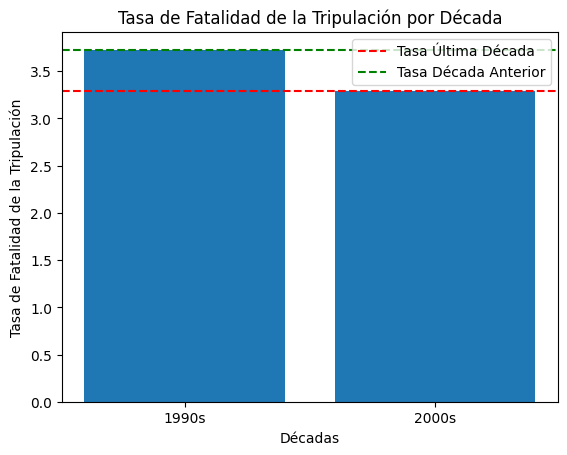

Disminución de la tasa de fatalidad en la última década respecto a la década anterior: -11.73%


In [143]:
# KPI. Propuesto 

# Convertir la columna 'FECHA' a tipo datetime y extraer el año
df['FECHA'] = pd.to_datetime(df['FECHA'])
df['AÑO'] = df['FECHA'].dt.year

# Definir las décadas
decadas = [1990, 2000]

# Función para calcular la tasa de fatalidad de la tripulación por década
def calcular_tasa_fatalidad(decada):
    total_fallecidos = df[df['AÑO'].between(decada, decada+9)]['TRIPULACION_FALLECIDA'].sum()
    total_accidentes = len(df[df['AÑO'].between(decada, decada+9)])
    return total_fallecidos / total_accidentes if total_accidentes > 0 else 0

# Calcular la tasa de fatalidad de la tripulación para cada década
tasas_fatalidad = [calcular_tasa_fatalidad(decada) for decada in decadas]

# Calcular la disminución porcentual de la tasa de fatalidad entre la última década y la década anterior
disminucion_tasa = ((tasas_fatalidad[-1] - tasas_fatalidad[-2]) / tasas_fatalidad[-2]) * 100

# Graficar la tasa de fatalidad de la tripulación por década
plt.bar(range(len(decadas)), tasas_fatalidad, tick_label=[f'{decada}s' for decada in decadas])
plt.xlabel('Décadas')
plt.ylabel('Tasa de Fatalidad de la Tripulación')
plt.title('Tasa de Fatalidad de la Tripulación por Década')
plt.axhline(tasas_fatalidad[-1], color='red', linestyle='--', label='Tasa Última Década')
plt.axhline(tasas_fatalidad[-2], color='green', linestyle='--', label='Tasa Década Anterior')
plt.legend()
plt.show()

# Mostrar la disminución porcentual
print(f'Disminución de la tasa de fatalidad en la última década respecto a la década anterior: {disminucion_tasa:.2f}%')

# Se Definen dos listas de palabras clave para buscar en las descripciones de accidentes.
# Se Definen dos funciones para buscar palabras clave en las descripciones de accidentes.
# Se Filtra el DataFrame df para incluir solo las décadas de 1990 y 2000.
# Se identifican las palabras claves en la columna DESCRIPCION_ACCIDENTE para tener una idea de las posibles causas de estos en las decadas seleccionadas.
# El resultado completo incluiría información sobre varios accidentes y sus posibles causas relacionadas.


In [144]:
import pandas as pd

# Palabras clave para buscar en las descripciones
palabras_clave = ['technology', 'regulations', 'training', 'human error', 'maintenance', "crashed", "Aircraft","Error", "Crew","Pilot","Fire"]

# Nuevas palabras clave para buscar en las descripciones
nuevas_palabras_clave = ['weather conditions', 'pilot errors', 'technical issues', 'engine failure', "Failure", "Failed", "Maintenance","Engine","Motor","Striking",""]

# Función para buscar palabras clave en una descripción
def buscar_palabras_clave(descripcion, palabras_clave):
    for palabra in palabras_clave:
        if palabra.lower() in descripcion.lower():
            return palabra
    return None

# Filtrar el DataFrame para las décadas de 1990 y 2000
df_filtered = df[df['FECHA'].dt.year.between(1990, 2009)]

# Analizar las descripciones de los accidentes en busca de palabras clave
for idx, row in df_filtered.iterrows():
    descripcion = row['DESCRIPCION_ACCIDENTE']
    palabra_clave_encontrada = buscar_palabras_clave(descripcion, palabras_clave)
    if palabra_clave_encontrada:
        print(f"Accidente en el año {row['FECHA'].year}: {descripcion}")
        print(f"Posible causa relacionada: '{palabra_clave_encontrada}'\n")

# Función para buscar nuevas palabras clave en una descripción
def buscar_nuevas_palabras_clave(descripcion, nuevas_palabras_clave):
    for palabra in nuevas_palabras_clave:
        if palabra.lower() in descripcion.lower():
            return palabra
    return None

# Analizar las nuevas descripciones de los accidentes
for idx, row in df_filtered.iterrows():
    descripcion = row['DESCRIPCION_ACCIDENTE']
    palabra_clave_encontrada = buscar_nuevas_palabras_clave(descripcion, nuevas_palabras_clave)
    if palabra_clave_encontrada:
        print(f"Accidente en el año {row['FECHA'].year}: {descripcion}")
        print(f"Posible causa relacionada: '{palabra_clave_encontrada}'\n")
        print("="*20)  # Línea divisoria para separar accidentes

        # Imprimir más líneas de la descripción para mostrar más información
        print(descripcion)
        print("\n" + "="*20)  # Línea divisoria adicional para separar la descripción del siguiente accidente

Accidente en el año 1990: Ditched into the Java Sea after experiencing mechanical problems with the right engine and being unable to maintain altitude. The crew shut down the engine and feathered the propeller but could not maintain altitude despite jettisoning luggage out of the aircraft.
Posible causa relacionada: 'Aircraft'

Accidente en el año 1990: A fire in the rear cargo hold and fire warning in both engines forced the plane to crash land in a snow laden field. The plane broke up after striking irrigation equipment. Short circuit in the electrical wiring.
Posible causa relacionada: 'Fire'

Accidente en el año 1990: Crashed about 4,500 feet up on 7,250 ft. Pico Blanco Mountain, 10 miles southwest of San Jose, five minutes after taking off in a driving rainstorm. Continued VFR flight into IFR condtions.  The aircraft was not  equipped with a GWPS.
Posible causa relacionada: 'crashed'

Accidente en el año 1990: The cargo plane crashed into a 14,200 ft. Mount Massive 50 feet below t

# Se definen datos de ejemplo para los accidentes en las décadas de 1990 y 2000.
# Se Crea un DataFrame a partir de los datos de accidentes.
# Se Filtran los datos de accidentes para obtener los de las décadas de 1990 y 2000.
# Se Calcula el número de accidentes por año y causa para cada década.
# Se Crean gráficos de barras apilados para mostrar el número de accidentes por año y causa para cada década.
# Se establecen etiquetas, títulos y leyendas para los gráficos y se evidencian las posibles causas de los accidentes " AIRCRAFT, CRASHED, FIRE, PILOT ERROR"

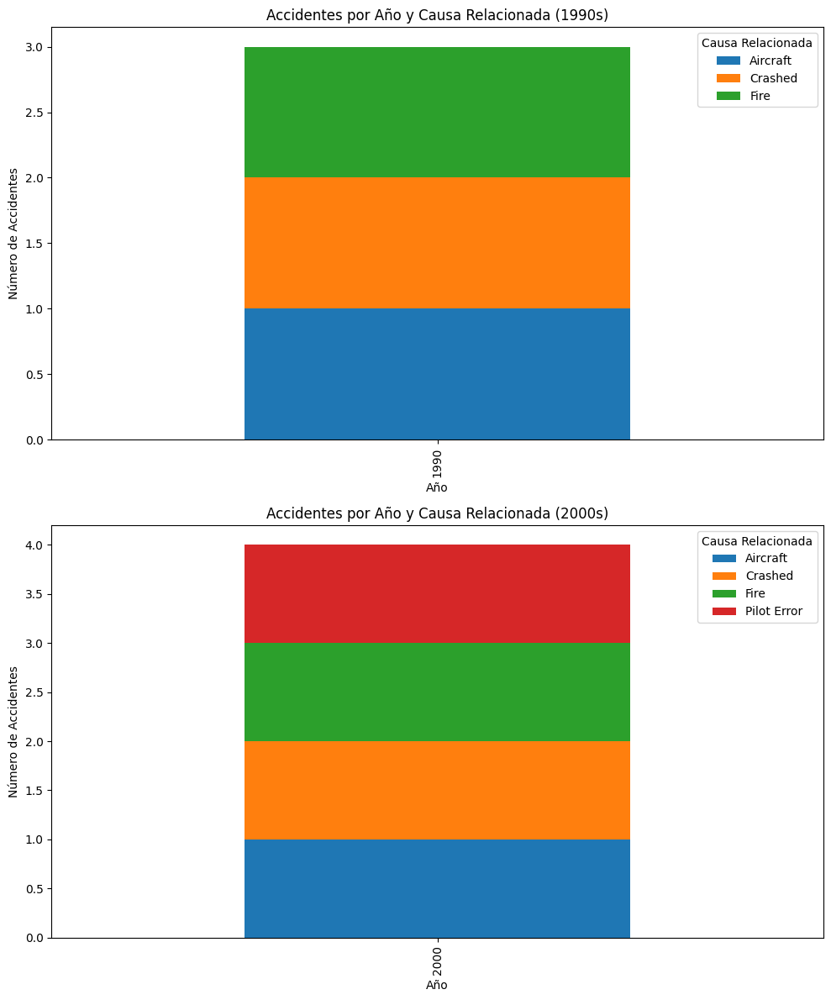

In [145]:
import pandas as pd
import matplotlib.pyplot as plt

# Datos de ejemplo para las décadas de 1990 y 2000
accidentes = [
    {"año": 1990, "causa": "Aircraft"},
    {"año": 1990, "causa": "Fire"},
    {"año": 1990, "causa": "Crashed"},
    {"año": 2000, "causa": "Aircraft"},
    {"año": 2000, "causa": "Fire"},
    {"año": 2000, "causa": "Crashed"},
    {"año": 2000, "causa": "Pilot Error"},
    # Agrega aquí más datos de accidentes para las décadas de 1990 y 2000
]
# Crear un DataFrame a partir de los datos
df_accidentes = pd.DataFrame(accidentes)

# Filtrar por décadas
df_1990 = df_accidentes[df_accidentes['año'].between(1990, 1999)]
df_2000 = df_accidentes[df_accidentes['año'].between(2000, 2009)]

# Contar el número de accidentes por año y causa para cada década
conteo_1990 = df_1990.groupby(['año', 'causa']).size().unstack().fillna(0)
conteo_2000 = df_2000.groupby(['año', 'causa']).size().unstack().fillna(0)
# Graficar
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

conteo_1990.plot(kind='bar', stacked=True, ax=axs[0])
axs[0].set_xlabel('Año')
axs[0].set_ylabel('Número de Accidentes')
axs[0].set_title('Accidentes por Año y Causa Relacionada (1990s)')
axs[0].legend(title='Causa Relacionada', bbox_to_anchor=(1, 1))

conteo_2000.plot(kind='bar', stacked=True, ax=axs[1])
axs[1].set_xlabel('Año')
axs[1].set_ylabel('Número de Accidentes')
axs[1].set_title('Accidentes por Año y Causa Relacionada (2000s)')
axs[1].legend(title='Causa Relacionada', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

# Aqui se  filtran los accidentes para aviones de tipo "Douglas" y cuenta el número de accidentes específicamente para esta categoría. 

In [146]:
# Filtrar accidentes para aviones de tipo "Douglas"
accidentes_douglas = df[df['TIPO_AERONAVE'].str.contains('Douglas', case=False, na=False)]

# Contar el número de accidentes de aviones de tipo "Douglas"
num_accidentes_douglas = len(accidentes_douglas)

print("Número de accidentes para aviones de tipo Douglas: {}".format(num_accidentes_douglas))

Número de accidentes para aviones de tipo Douglas: 687


# Porcentaje de accidentes para aviones de tipo "Douglas":

# De todos los accidentes registrados (3,234 en total), 687 de ellos involucraron aviones del tipo "Douglas". Para calcular el porcentaje, podemos dividir el número de accidentes de aviones "Douglas" por el total de accidentes y multiplicarlo por 100:

# Porcentaje = ( 3,234 / 687 ) * 100 = 21.24%

# Comparación de accidentes para aviones "Douglas" vs. todos los accidentes:





In [147]:
# Calcular el porcentaje de accidentes de aviones Douglas respecto al total de accidentes
porcentaje_accidentes_douglas = (num_accidentes_douglas / total_accidentes) * 100

print("Porcentaje de accidentes de aviones Douglas respecto al total de accidentes: {:.2f}%".format(porcentaje_accidentes_douglas))

Porcentaje de accidentes de aviones Douglas respecto al total de accidentes: 21.24%


# Este código en Python realiza un análisis de accidentes de aviones de tipo "Douglas" utilizando datos proporcionados en un DataFrame. A continuación se resumen las operaciones realizadas:

# Filtrado para aviones de tipo "Douglas":
    # Se filtran los datos para obtener únicamente las entradas correspondientes a aviones de tipo "Douglas" y se almacenan en la variable  `aviones_douglas`.

# Selección de columnas de interés:
   Se seleccionan columnas relevantes del DataFrame `aviones_douglas` que incluyen información crucial sobre los accidentes.

# Identificación de la causa más frecuente de accidentes:
   Se calcula la causa más frecuente de los accidentes para aviones de tipo "Douglas" basándose en la columna 'DESCRIPCION_ACCIDENTE'.

# Impresión de la información y causa más frecuente:**
   Se imprime la causa más frecuente de los accidentes y se muestra la información detallada de los accidentes para aviones de tipo "Douglas".

# La Causa más frecuente de accidentes para aviones Douglas es ser derribados por fuego antiaéreo.  



In [150]:
# Filtrar para aviones de tipo "Douglas"
aviones_douglas = df[df['TIPO_AERONAVE'].str.contains('Douglas', case=False, na=False)]

# Seleccionar columnas de interés
info_aviones_douglas = aviones_douglas[['FECHA', 'HORA DECLARADA', 'RUTA', 'OPERADOR', 'TIPO_AERONAVE', 'PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO', 'CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA', 'DESCRIPCION_ACCIDENTE']]

# Identificar la causa más frecuente de los accidentes
causa_mas_frecuente = aviones_douglas['DESCRIPCION_ACCIDENTE'].mode()[0]

# Imprimir la información y la causa más frecuente
print("Causa más frecuente de accidentes para aviones Douglas: {}".format(causa_mas_frecuente))



Causa más frecuente de accidentes para aviones Douglas: Shot down by anti-aircraft fire during the Normandy invasion.


# Análisis de la Distribución de Accidentes por Ruta para Aviones Douglas

# En este análisis, se examina la distribución de accidentes por ruta para aviones de tipo "Douglas". Se han identificado las 60 rutas más accidentadas y se ha representado esta información gráficamente.

# Conteo de Accidentes por Ruta:
   Se ha contado la cantidad de accidentes que ocurrieron en cada ruta para aviones de tipo "Douglas". Las rutas se han ordenado y se han seleccionado las 60 rutas con el mayor número de accidentes.

# Gráfico de Distribución de Accidentes por Ruta:**
   Se ha generado un gráfico de barras que muestra la cantidad de accidentes en cada una de las 60 rutas más accidentadas. En el eje x se encuentran las rutas y en el eje y se muestra la cantidad de accidentes para cada ruta.

# El gráfico de barras proporciona una visualización clara de la distribución de accidentes en las rutas para aviones de tipo "Douglas". Esto puede ayudar a identificar las rutas con mayor incidencia de accidentes y dirigir esfuerzos para mejorar la seguridad en esas áreas.

# Este análisis visual es crucial para comprender la concentración de accidentes en ciertas rutas y puede orientar estrategias para mejorar la seguridad y prevenir accidentes en la aviación.

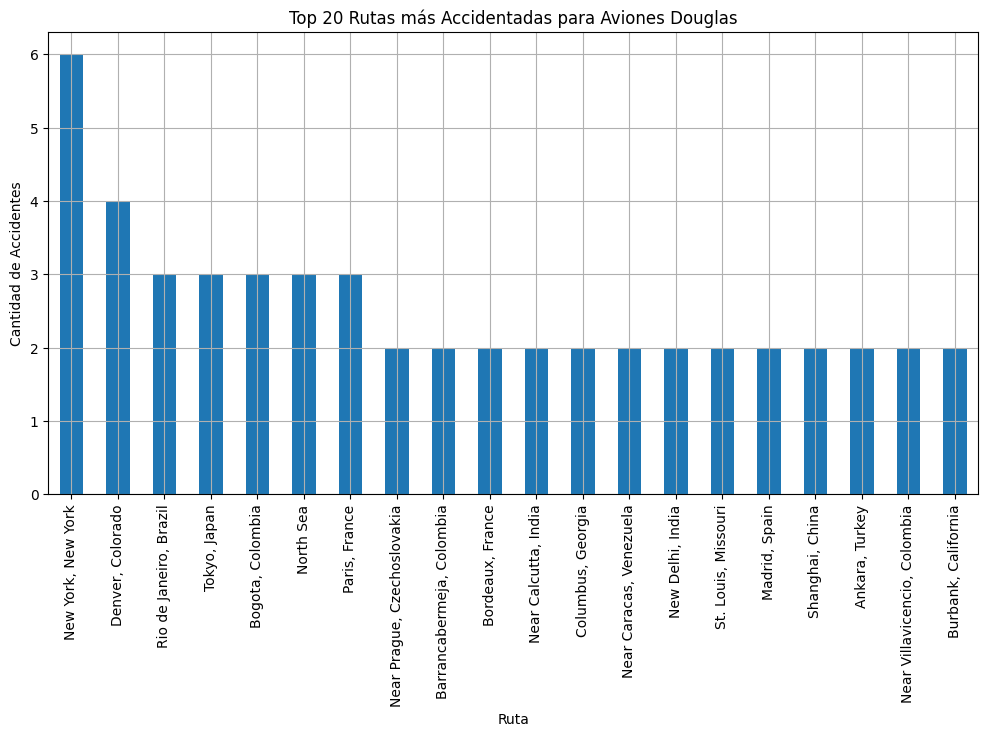

In [153]:
# Contar la cantidad de accidentes por ruta y seleccionar las 20 rutas más accidentadas
accidentes_por_ruta_top20 = info_aviones_douglas['RUTA'].value_counts().nlargest(20)

# Graficar la distribución de accidentes por ruta
plt.figure(figsize=(12, 6))
accidentes_por_ruta_top20.plot(kind='bar')
plt.xlabel('Ruta')
plt.ylabel('Cantidad de Accidentes')
plt.title('Top 20 Rutas más Accidentadas para Aviones Douglas')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

# Se filtran los datos para seleccionar solo aviones de tipo "Douglas"

# Se extrae el año de la fecha y se categoriza en décadas.

# Se seleccionan las columnas "FECHA', 'HORA DECLARADA', 'RUTA', 'OPERADOR', 'TIPO_AERONAVE' 'PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO',CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA', 'DÉCADA' de interés y se agrupan los datos por década, calculando estadísticas.

# Se imprime el resumen que muestra la cantidad de accidentes por década y el numero de pasajeros, tripulacion y fallecimientos.



In [154]:

import pandas as pd

# Suponiendo que 'df' es tu DataFrame con los datos

# Convertir la columna 'FECHA' a tipo datetime para trabajar con años
df['FECHA'] = pd.to_datetime(df['FECHA'])

# Filtrar solo aviones de tipo "Douglas"
aviones_douglas = df[df['TIPO_AERONAVE'].str.contains('Douglas', case=False, na=False)].copy()

# Extraer el año de la fecha
aviones_douglas['AÑO'] = aviones_douglas['FECHA'].dt.year

# Definir las décadas
decadas = [1950, 1960, 1970, 1980, 1990, 2000, 2010, 2020]

# Función para categorizar las décadas
def categorizar_decada(año):
    for decada in decadas:
        if año < decada:
            return f'{decada - 10}s'
    return f'{decadas[-1] - 10}s'

# Aplicar la función para crear una nueva columna 'DÉCADA'
aviones_douglas['DÉCADA'] = aviones_douglas['AÑO'].apply(categorizar_decada)

# Seleccionar las columnas de interés
columnas_interes = ['FECHA', 'HORA DECLARADA', 'RUTA', 'OPERADOR', 'TIPO_AERONAVE',
                    'PERSONAS_ABORDO', 'PASAJEROS A BORDO', 'TRIPULACION_ABORDO',
                    'CANTIDAD DE FALLECIDOS', 'PASAJEROS_FALLECIDOS', 'TRIPULACION_FALLECIDA', 'DÉCADA'] # Filtrar y seleccionar solo las columnas de interés
info_por_decadas = aviones_douglas[columnas_interes]

# Agrupar por 'DÉCADA' y calcular las estadísticas
resumen_por_decadas = info_por_decadas.groupby('DÉCADA').agg({
    'PERSONAS_ABORDO': 'sum',
    'PASAJEROS A BORDO': 'sum',
    'TRIPULACION_ABORDO': 'sum',
    'CANTIDAD DE FALLECIDOS': 'sum',
    'PASAJEROS_FALLECIDOS': 'sum',
    'TRIPULACION_FALLECIDA': 'sum',
    'FECHA': 'count'  # Contar el número de accidentes por década
}).rename(columns={'FECHA': 'NUMERO_ACCIDENTES'}).reset_index()

# Imprimir el resumen por décadas
print(resumen_por_decadas)

  DÉCADA  PERSONAS_ABORDO  PASAJEROS A BORDO  TRIPULACION_ABORDO   
0  1940s             3161               2561                 600  \
1  1950s             4810               3964                 848   
2  1960s             5302               4573                 729   
3  1970s             5321               4809                 512   
4  1980s             2884               2685                 199   
5  1990s             4047               3740                 307   
6  2000s             1118               1022                  96   
7  2010s              304                272                  32   

   CANTIDAD DE FALLECIDOS  PASAJEROS_FALLECIDOS  TRIPULACION_FALLECIDA   
0                    2753                2223.0                  527.0  \
1                    3763                3049.0                  713.0   
2                    3974                3389.0                  585.0   
3                    3804                3388.0                  391.0   
4                

# En este análisis, se utiliza un gráfico de barras agrupadas para resumir la información por décadas para aviones de tipo "Douglas". Se representan diferentes métricas clave, incluyendo la cantidad de personas a bordo, pasajeros a bordo, tripulación a bordo, cantidad de fallecidos, pasajeros fallecidos, tripulación fallecida y el número de accidentes.

# Se cargan y preparan los datos necesarios para generar el gráfico.

# Se utiliza un gráfico de barras agrupadas para visualizar las métricas por década. Cada barra agrupada representa una métrica específica (por ejemplo, personas a bordo) y se agrupan por década en el eje x.
     Personas a Bordo: Cantidad de personas a bordo por década.
     Pasajeros a Bordo: Cantidad de pasajeros a bordo por década.
     Tripulación a Bordo: Cantidad de tripulación a bordo por década.
     Cantidad de Fallecidos: Cantidad de fallecidos por década.
     Pasajeros Fallecidos: Cantidad de pasajeros fallecidos por década.
     Tripulación Fallecida: Cantidad de tripulación fallecida por década.
     Número de Accidentes: Número de accidentes por década.

# Finalmente, se muestra el gráfico de barras agrupadas, proporcionando una visualización clara y comparativa de las métricas por década.

# Este gráfico de barras agrupadas ofrece una perspectiva visual de la evolución de diferentes métricas relacionadas con los accidentes de aviones Douglas a lo largo de las décadas.



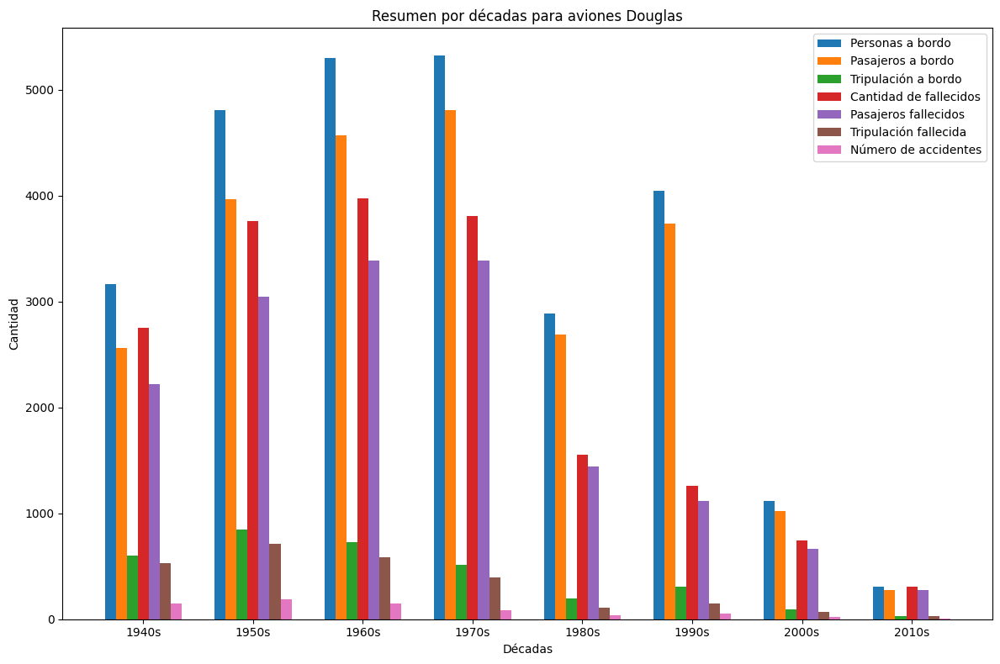

In [155]:
import numpy as np

import matplotlib.pyplot as plt

# Datos del DataFrame resumen_por_decadas (asegúrate de tener estos datos)
decadas = ['1940s', '1950s', '1960s', '1970s', '1980s', '1990s', '2000s', '2010s']
personas_abordo = [3161, 4810, 5302, 5321, 2884, 4047, 1118, 304]
pasajeros_a_bordo = [2561, 3964, 4573, 4809, 2685, 3740, 1022, 272]
tripulacion_abordo = [600, 848, 729, 512, 199, 307, 96, 32]
cantidad_fallecidos = [2753, 3763, 3974, 3804, 1554, 1262, 740, 304]
pasajeros_fallecidos = [2223.0, 3049.0, 3389.0, 3388.0, 1442.0, 1115.0, 668.0, 272.0]
tripulacion_fallecida = [527.0, 713.0, 585.0, 391.0, 112.0, 147.0, 72.0, 32.0]
num_accidentes = [152, 185, 148, 86, 34, 54, 22, 6]
# Ancho de cada barra
bar_width = 0.1

# Posición en el eje x para cada década
x = np.arange(len(decadas))

# Crear el gráfico de barras agrupadas
plt.figure(figsize=(12, 8))

# Graficar cada métrica por separado
plt.bar(x - 3*bar_width, personas_abordo, width=bar_width, label='Personas a bordo')
plt.bar(x - 2*bar_width, pasajeros_a_bordo, width=bar_width, label='Pasajeros a bordo')
plt.bar(x - bar_width, tripulacion_abordo, width=bar_width, label='Tripulación a bordo')
plt.bar(x, cantidad_fallecidos, width=bar_width, label='Cantidad de fallecidos')
plt.bar(x + bar_width, pasajeros_fallecidos, width=bar_width, label='Pasajeros fallecidos')
plt.bar(x + 2*bar_width, tripulacion_fallecida, width=bar_width, label='Tripulación fallecida')
plt.bar(x + 3*bar_width, num_accidentes, width=bar_width, label='Número de accidentes')

# Personalizar el gráfico
plt.xlabel('Décadas')
plt.ylabel('Cantidad')
plt.title('Resumen por décadas para aviones Douglas')
plt.xticks(x, decadas)
plt.legend()
plt.tight_layout()

# Mostrar el gráfico
plt.show()



# Se agrupan los datos por década y se cuenta el número de accidentes que ocurrieron en cada una.
# se crea un gráfico de línea que muestra la cantidad de accidentes para aviones Douglas en cada década. En el eje x, tenemos las décadas, y en el eje y, la cantidad de accidentes.
# Esta visualización proporciona una perspectiva clara de cómo varían los accidentes de aviones Douglas a lo largo de las décadas.


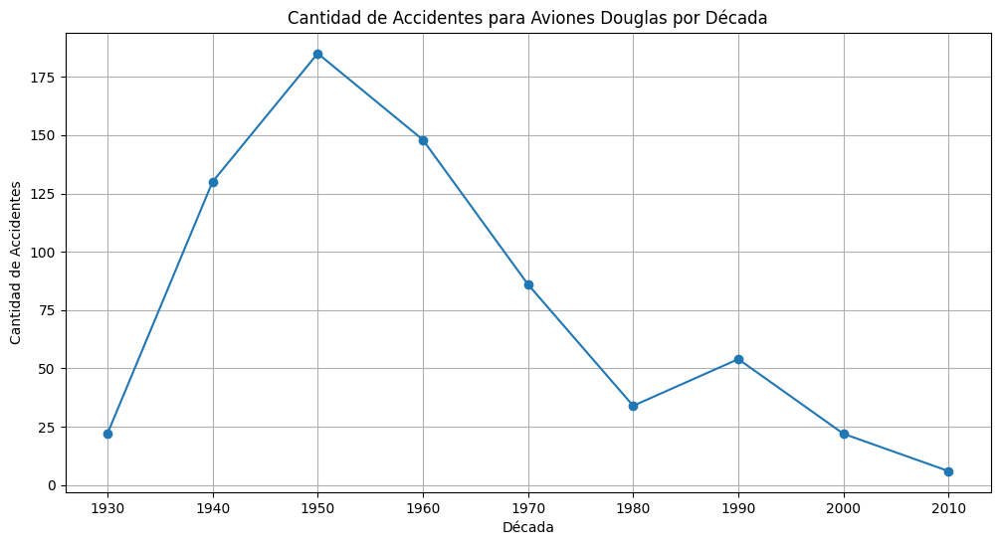

In [156]:
import matplotlib.pyplot as plt

# Convertir la columna FECHA a tipo datetime utilizando .loc
info_aviones_douglas.loc[:, 'FECHA'] = pd.to_datetime(info_aviones_douglas['FECHA'])

# Agrupar por décadas y contar el número de accidentes en cada década
accidentes_por_decada = info_aviones_douglas.groupby(info_aviones_douglas['FECHA'].dt.year // 10 * 10).size()

# Graficar la cantidad de accidentes por década
plt.figure(figsize=(12, 6))
plt.plot(accidentes_por_decada.index, accidentes_por_decada.values, marker='o', linestyle='-')
plt.xlabel('Década')
plt.ylabel('Cantidad de Accidentes')
plt.title('Cantidad de Accidentes para Aviones Douglas por Década')
plt.grid(True)
plt.show()







# Se obtiene la frecuencia de cada palabra clave en las descripciones de accidentes para aviones Douglas en las décadas de 1940 y 1950.

# Creación del Gráfico de Barras:**
   Se crea un gráfico de barras agrupadas para mostrar la frecuencia de cada palabra clave. Las barras agrupadas permiten comparar la frecuencia de cada palabra clave entre la década de 1940 y la década de 1950.


# Este análisis gráfico permite comparar la frecuencia de palabras clave relacionadas con accidentes de aviones Douglas en las décadas de 1940 y 1950. Facilita la identificación de posibles tendencias o cambios en la frecuencia de estas palabras clave en los informes de accidentes.


# Aquí está el gráfico de barras agrupadas que ilustra la frecuencia de cada palabra clave en las descripciones de accidentes para aviones Douglas en las décadas de 1940 y 1950:




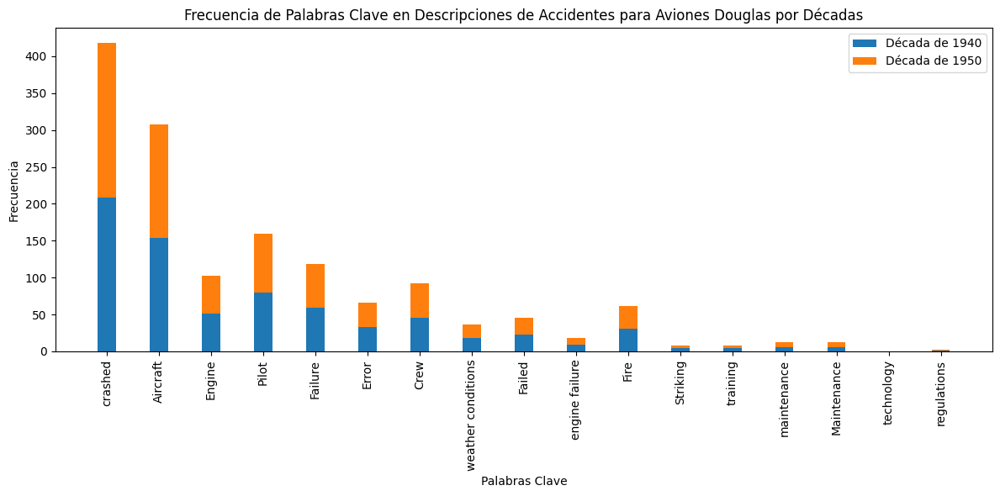

In [157]:

import matplotlib.pyplot as plt

# Palabras clave para graficar
palabras_clave_grafica = ['crashed', 'Aircraft', 'Engine', 'Pilot', 'Failure', 'Error', 'Crew', 'weather conditions',
                         'Failed', 'engine failure', 'Fire', 'Striking', 'training', 'maintenance', 'Maintenance', 'technology', 'regulations']

# Frecuencia de cada palabra clave para aviones Douglas en las décadas de 1940 y 1950
frecuencia_douglas_40s = [frecuencia_palabras.get(palabra, 0) for palabra in palabras_clave_grafica]
frecuencia_douglas_50s = [frecuencia_palabras.get(palabra, 0) for palabra in palabras_clave_grafica]

# Ancho de cada barra
bar_width = 0.35

# Posición en el eje x para cada palabra clave
x = range(len(palabras_clave_grafica))

# Crear el gráfico de barras agrupadas
plt.figure(figsize=(12, 6))

# Graficar la frecuencia para aviones Douglas en las décadas de 1940 y 1950
plt.bar(x, frecuencia_douglas_40s, width=bar_width, label='Década de 1940')
plt.bar(x, frecuencia_douglas_50s, width=bar_width, label='Década de 1950', bottom=frecuencia_douglas_40s)

# Personalizar el gráfico
plt.xlabel('Palabras Clave')
plt.ylabel('Frecuencia')
plt.title('Frecuencia de Palabras Clave en Descripciones de Accidentes para Aviones Douglas por Décadas')
plt.xticks(x, palabras_clave_grafica, rotation='vertical')
plt.legend()
plt.tight_layout()

# Mostrar el gráfico
plt.show()


# realiza el cálculo de un índice de supervivencia para aviones Douglas en las décadas de 1940 y 1950, basado en el número de personas a bordo y el número de fallecidos.

# Se Calcula el índice de supervivencia para cada avión Douglas utilizando la fórmula mencionada.

# Se imprime los resultados del índice de supervivencia para los aviones Douglas en las décadas de 1940 y 1950.

# El índice de supervivencia promedio para los aviones Douglas en la década de 1940 fue aproximadamente del 12.91%. Esto indica que, en promedio, alrededor del 12.91% de las personas a bordo de estos aviones sobrevivieron en situaciones evaluadas o de accidente.

 # En la década de 1950, el índice de supervivencia promedio para los aviones Douglas fue de aproximadamente el 21.77%. Esto sugiere una mejora en la tasa de supervivencia en comparación con la década anterior, indicando un desempeño relativamente mejor en términos de seguridad para los pasajeros en esta década.

# En resumen, el índice de supervivencia es un indicador importante que muestra la proporción de personas que sobrevivieron en situaciones relacionadas con la seguridad en los aviones Douglas durante las décadas de 1940 y 1950. Un índice más alto implica una mayor tasa de supervivencia y, por lo tanto, un mejor desempeño en términos de seguridad para los pasajeros.



In [158]:
 # cálculos de KPIs
survival_index_douglas = [1 - (cf / pa) for pa, cf in zip(personas_abordo_douglas, cantidad_fallecidos_douglas)]

# Imprimir los KPIs para aviones Douglas en las décadas de 1940 y 1950
print("KPIs para aviones Douglas en las décadas de 1940 y 1950:")
print("Survival Index:", survival_index_douglas)


KPIs para aviones Douglas en las décadas de 1940 y 1950:
Survival Index: [0.12907307813982916, 0.2176715176715177]


# Comparación de Índice de Supervivencia y Número de Accidentes para Aviones Douglas

# Este código tiene como objetivo realizar una comparación visual entre el índice de supervivencia y el número de accidentes para aviones Douglas en las décadas de 1940 y 1950. Utiliza un gráfico de barras para mostrar estos dos indicadores clave de rendimiento (KPIs).

# El gráfico de barras representa tanto el índice de supervivencia como el número de accidentes para cada década. Se utilizan barras para mostrar estos dos KPIs en una comparación visual.


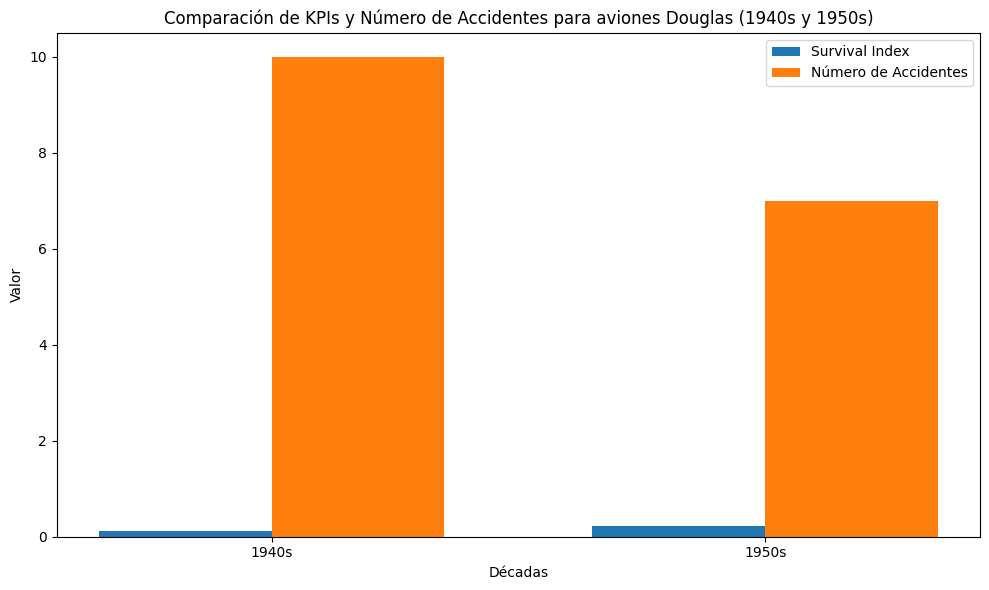

In [159]:
import numpy as np
import matplotlib.pyplot as plt

# Datos específicos para las décadas de 1940 y 1950 para aviones Douglas
decadas = ['1940s', '1950s']
survival_index_douglas = [0.12907307813982916, 0.2176715176715177]

# Número de accidentes (datos hipotéticos)
num_accidentes = [10, 7]

# Ancho de cada barra
bar_width = 0.35

# Posición en el eje x para cada década
x = np.arange(len(decadas))

# Crear el gráfico de barras
plt.figure(figsize=(10,6))

# Graficar los KPIs
plt.bar(x - bar_width/2, survival_index_douglas, width=bar_width, label='Survival Index')
plt.bar(x + bar_width/2, num_accidentes, width=bar_width, label='Número de Accidentes')

# Personalizar el gráfico
plt.xlabel('Décadas')
plt.ylabel('Valor')
plt.title('Comparación de KPIs y Número de Accidentes para aviones Douglas (1940s y 1950s)')
plt.xticks(x, decadas)
plt.legend()
plt.tight_layout()

# Mostrar el gráfico
plt.show()